### Methods

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from collections import deque

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Calibrate camera - return camera matrix and distortion coefficients
def calibrate_camera(imageShape, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imageShape, None, None)
    return mtx, dist;

# Undistort image
def undistort_image(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def abs_sobel_thresh(img, orient='x', thresh=(0,255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif (orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

                     
def color_threshold(undist_image, s_thresh=(0,255), v_thresh=(0,255)):                     
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(undist_image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
                     
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(undist_image, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
                     
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
                     
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= v_thresh[0]) & (v_channel <= v_thresh[1])] = 1
                     
    combined_binary = np.zeros_like(s_channel)
    combined_binary[(s_binary == 1) & (v_binary == 1)] = 1
    
    return combined_binary;
                     
def color_gradient_treshold(undist_image):
    sx_binary = abs_sobel_thresh(undist_image, orient = 'x', thresh=(10,255))
    sy_binary = abs_sobel_thresh(undist_image, orient = 'y', thresh=(20,255))
    gradient_binary = np.zeros_like(sx_binary)
    gradient_binary[(sx_binary == 1) & (sy_binary == 1)] = 1
    color_binary = color_threshold(undist_image, s_thresh=(100,255), v_thresh=(50,255))
    
    combined_binary = np.zeros_like(color_binary)
    combined_binary[(gradient_binary == 1) | (color_binary == 1)] = 1
    
    return combined_binary

def perspective_transform_image(gray):    
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    x_offset = img_size[0] / 4 # x offset for dst points
    y_offset = get_horizon(gray) # y offset for dst points
    center_x_offset = x_offset / 6;
    bottom_y_offset = 35 # pixels - remove car hood

    # For source points I'm grabbing a trapezoid
    src = np.float32([[img_size[0]/2 - center_x_offset,y_offset], \
                     [img_size[0]/2 + center_x_offset,y_offset], \
                     [x_offset,img_size[1] - bottom_y_offset], \
                     [img_size[0] - x_offset,img_size[1] - bottom_y_offset]])
    
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    dst = np.float32([[x_offset, 0], [img_size[0]-x_offset, 0], \
                     [x_offset, img_size[1]], [img_size[0]-x_offset, img_size[1]]])
                                                                                                                                       
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(gray, M, img_size, flags=cv2.INTER_LINEAR)

    # Return the resulting image
    return warped, M, Minv

def find_lines_fit(binary_warped, left_fit, right_fit, margin_queue, visualize=False):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    ## Sliding Window if we don't have a prior fit
    if (left_fit is None or right_fit is None):
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        # md_offset - find lines that are away from middle
        md_offset = 40
        leftx_base = np.argmax(histogram[:midpoint-md_offset])
        rightx_base = np.argmax(histogram[midpoint+md_offset:]) + midpoint-md_offset

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)

        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        # Current window shifts(curvature) for momentum
        curve_margin = 0

        # Set minimum number of pixels found to recenter window
        minpix = 50

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin + curve_margin
            win_xleft_high = leftx_current + margin + curve_margin
            win_xright_low = rightx_current - margin + curve_margin
            win_xright_high = rightx_current + margin + curve_margin

            if (visualize):
                # Draw the windows on the visualization image
                cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            leftx_margin = 0
            rightx_margin = 0
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_old = leftx_current
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                leftx_margin = leftx_current - leftx_old
            if len(good_right_inds) > minpix:
                rightx_old = rightx_current
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
                rightx_margin = rightx_current - rightx_old
            
            # Add smoothed momentum based on window shifts.
            avg_margin = (leftx_margin + rightx_margin) / 2
            curve_margin = int(past_moving_average(margin_queue, avg_margin))
                
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    else:
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return out_img, left_fit, right_fit, nonzeroy, nonzerox, left_lane_inds, right_lane_inds

def visualize_line(binary_warped, out_img, left_fit, right_fit, nonzeroy, nonzerox, left_lane_inds, right_lane_inds):
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return out_img, ploty, left_fitx, right_fitx

def draw_driving_space(image, undist, warped, Minv, left_fitx, right_fitx, ploty):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result;

def get_radius_curvature(leftx, rightx, ploty):
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad

def get_car_offset(image, left_fit, right_fit):
    img_shape = image.shape
    ymax = img_shape[0]
    left_bottom_x = left_fit[0]*ymax**2 + left_fit[1]*ymax + left_fit[2]
    right_bottom_x = right_fit[0]*ymax**2 + right_fit[1]*ymax + right_fit[2]
    center_lanes_x = (left_bottom_x + right_bottom_x) / 2 # center of lanes - at the bottom
    center_image_x = img_shape[1] / 2 # center of image since camera is mounted at the center of the car
    
    pixel_distance_from_center = center_image_x - center_lanes_x
    pixel_distance_between_lanes = right_bottom_x - left_bottom_x
    
    return pixel_distance_from_center, pixel_distance_between_lanes
    
def add_text_to_image(image, text, points):
    cv2.putText(image, text, points, cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,255), 2, cv2.LINE_AA)
    
def past_moving_average(deque, elem, n=3):

    ## Just at start when we don't have enough data
    if (len(deque) < n):
        deque.append(elem)
        return elem

    deque.popleft()
    deque.append(elem)
    return sum(deque) / n

def get_horizon(image):
    
    """
    get line of horizon
    """
    
    return int(image.shape[0] * 0.65)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def get_lane_line_region_of_interest(image):
    
    """
    Get region of interest that fits the lane best and avoid other noise.
    
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    
    # Get image axis
    x_size = image.shape[1]
    y_size = image.shape[0]
    
    # Split x size to 10 parts
    part_size = 12
    x_grid_part_size = x_size / part_size;
    
    # The road "horizon"
    y_road_horizon = get_horizon(image)
    
    # Polygon x cordinates, symmetric from each end
    bottom_left_x = x_grid_part_size
    bottom_right_x = x_size - x_grid_part_size
    upper_left_x = int(x_grid_part_size * 5)
    upper_right_x = x_size - int(x_grid_part_size * 5)
    
    # Polygon vertics
    vertices = np.array([[(bottom_left_x,y_size), (upper_left_x, y_road_horizon)
                          , (upper_right_x, y_road_horizon), (bottom_right_x,y_size)]], dtype=np.int32)
    
    return vertices

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def equalizeIntensity(image):
    ycrcb = cv2.cvtColor(image,cv2.COLOR_RGB2YCrCb);
    y = ycrcb[:,:,0]
    cr = ycrcb[:,:,1]
    cb = ycrcb[:,:,2]
    equ = cv2.equalizeHist(y)
#     clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(20,20))
#     equ = clahe.apply(y)
    ycrcb = cv2.merge((equ,cr,cb))
    return cv2.cvtColor(ycrcb,cv2.COLOR_YCrCb2RGB);

### Calibrate Camera

In [2]:
# List of all calibration images
calibrationImagesPath = glob.glob('camera_cal/calibration*.jpg')
calibrationImagesCount = len(calibrationImagesPath)
calibrationImages = []
for calibrationImagePath in calibrationImagesPath:
    img = mpimg.imread(calibrationImagePath)
    calibrationImages.append(img)

# Store object and image points in arrays
objpoints = [] # 3d points - real world
imgpoints = [] # 2d points - image plane

# Chessboard sizes
nx = 9 # inner corners in x
ny = 6 # inner corners in y

# Prepare object points(corners)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x,y coordinates

for calibrationImage in calibrationImages:
    # Convert to grayscale
    gray = cv2.cvtColor(calibrationImage,cv2.COLOR_BGR2GRAY)
    
    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # If corners are found, add to image points and object points
    if (ret == True):
        imgpoints.append(corners)
        objpoints.append(objp)
        
imageShape = calibrationImage.shape[0:2]

# Calibrate Camera
mtx, dist = calibrate_camera(imageShape, objpoints, imgpoints)

# Undistort Image
image = mpimg.imread('camera_cal/calibration1.jpg')
undist_image = undistort_image(image, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Visualize Image Processing

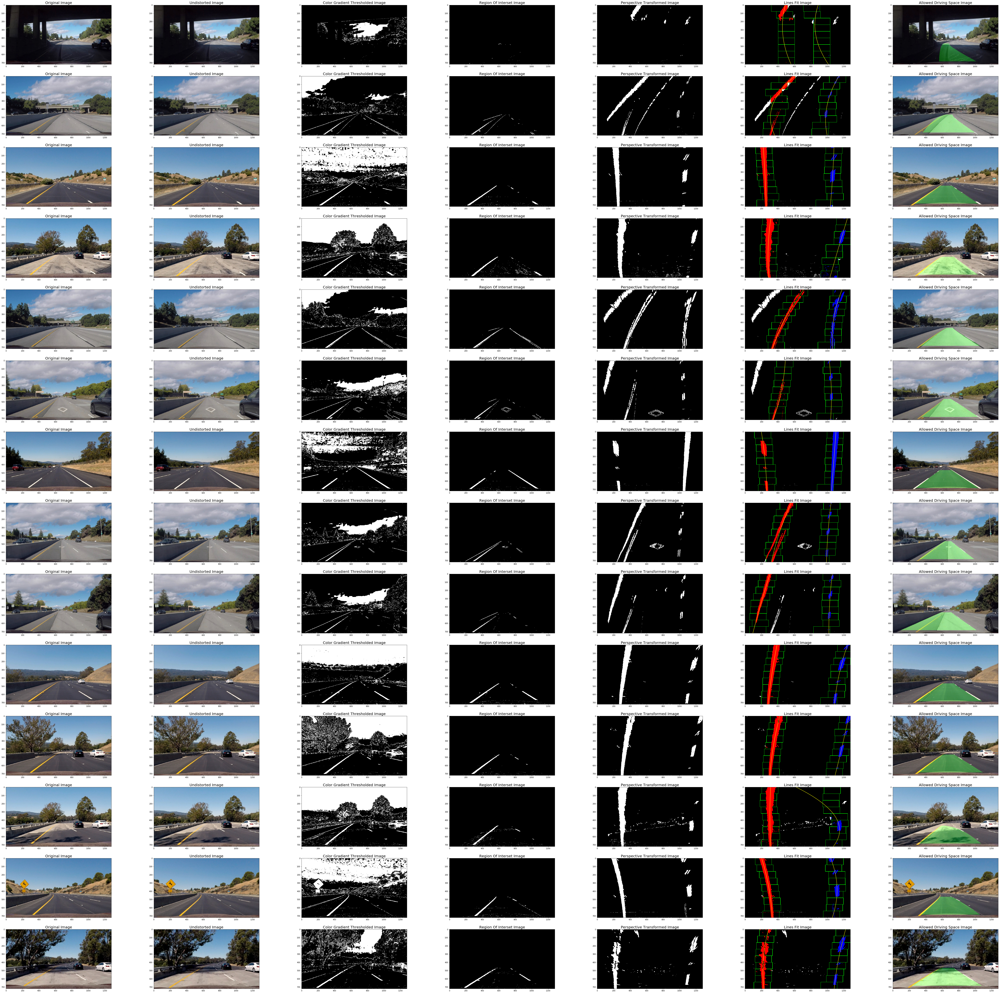

In [3]:
# Read in all test images
testImagesPath = glob.glob('test_images/*.jpg')
testImagesCount = len(testImagesPath)
testImages = []
for testImagePath in testImagesPath:
    img = mpimg.imread(testImagePath)
    testImages.append(img)

curve_margin_deque = deque([], maxlen=3)

%matplotlib inline

x_axis = 7
y_axis = testImagesCount

fig, ax = plt.subplots(y_axis,x_axis)
fig.set_size_inches(100, 100)

i = 0; # image counter
for image in testImages:
    
    # Show original image
    ax[i][0].set_title("Original Image",fontsize=20)
    ax[i][0].imshow(image)
    
    # Show undistored image
    undist_image = undistort_image(image, mtx, dist)
    ax[i][1].set_title("Undistorted Image",fontsize=20)
    ax[i][1].imshow(undist_image)
    
    # Show color gradient threshold image
    combined_binary_image = color_gradient_treshold(undist_image)
    ax[i][2].set_title("Color Gradient Thresholded Image",fontsize=20)
    ax[i][2].imshow(combined_binary_image, cmap='gray')
    
    # Show only region of interest, the region where the lanes are
    vertices = get_lane_line_region_of_interest(combined_binary_image)
    region_of_interest_image = region_of_interest(combined_binary_image, vertices)
    ax[i][3].set_title("Region Of Interset Image",fontsize=20)
    ax[i][3].imshow(region_of_interest_image, cmap='gray')
    
    # Show perspective transformed image
    perspective_transformed_image, M, Minv = perspective_transform_image(region_of_interest_image)
    ax[i][4].set_title("Perspective Transformed Image",fontsize=20)
    ax[i][4].imshow(perspective_transformed_image, cmap='gray')
    
    # Show lines
    lines_image,left_fit, right_fit, nonzeroy, nonzerox, left_lane_inds, right_lane_inds\
        = find_lines_fit(perspective_transformed_image, None, None, curve_margin_deque, True)
    lines_image, ploty, left_fitx, right_fitx = visualize_line\
        (perspective_transformed_image, lines_image, left_fit, right_fit,\
         nonzeroy, nonzerox, left_lane_inds, right_lane_inds)
    ax[i][5].set_title("Lines Fit Image",fontsize=20)
    ax[i][5].imshow(lines_image)
    ax[i][5].plot(left_fitx, ploty, color='yellow')
    ax[i][5].plot(right_fitx, ploty, color='yellow')
    
    # Driving allowed space
    driving_space_image = draw_driving_space(image, undist_image, perspective_transformed_image, Minv, left_fitx, right_fitx, ploty)
    ax[i][6].set_title("Allowed Driving Space Image",fontsize=20)
    ax[i][6].imshow(driving_space_image)
    
    # Increment image counter
    i += 1
        
plt.show()

### Pipeline

In [4]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = None  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #ploty
        self.current_ploty = None
        #sliding window failed retries
        self.sliding_window_tries = 0

In [5]:
# Create lines for lanes
left_line = Line()
right_line = Line()

# Create queus to smooth all sort of data
curve_margin_deque = deque([], maxlen=3)
left_polynomial_coefficients_deque = deque([], maxlen=3)
right_polynomial_coefficients_deque = deque([], maxlen=3)
left_x_deque = deque([], maxlen=3)
right_x_deque = deque([], maxlen=3)

# Failed sliding window tries limit
sliding_window_retries = 2

def process_image(image):
    # If didn't find left/right fit from prior fits, reset search
    if (left_line.sliding_window_tries >= sliding_window_retries \
        or right_line.sliding_window_tries >= sliding_window_retries):
        
        left_best_fit = None
        right_best_fit = None
    else:
        left_best_fit = left_line.best_fit
        right_best_fit = right_line.best_fit
    
    # Undistort image
    undist_image = undistort_image(image, mtx, dist)
      
    # Color and gradient threshold image
    combined_binary_image = color_gradient_treshold(undist_image)
    
    # Region of intereset mask
    vertices = get_lane_line_region_of_interest(combined_binary_image)
    region_of_interest_image = region_of_interest(combined_binary_image, vertices)
   
    # Perspective transform image - "bird view"
    perspective_transformed_image, M, Minv = \
        perspective_transform_image(region_of_interest_image)
    
    # find lanes
    lines_image, left_fit, right_fit, nonzeroy, nonzerox, left_lane_inds, right_lane_inds\
        = find_lines_fit(perspective_transformed_image, left_best_fit,\
            right_best_fit, curve_margin_deque, False)
    
    # visualize lanes
    lines_image, ploty, left_fitx, right_fitx = visualize_line(\
        perspective_transformed_image,lines_image, left_fit, right_fit\
        , nonzeroy, nonzerox, left_lane_inds, right_lane_inds)
         
    # radius curvature - both lines should have similiar curvature
    left_curverad, right_curverad = get_radius_curvature(left_fitx, right_fitx, ploty)
    radius_of_curvature_in_meters = (left_curverad + right_curverad) / 2
    curaverad_sanity_check = (max(left_curverad,right_curverad) / \
        min(left_curverad,right_curverad)) <= 1.5
    
    # car offset
    pixel_distance_from_center, pixel_distance_between_lanes = get_car_offset(undist_image, left_fit, right_fit)
    # the lanes in the perspective transform are not completly parallel
    #so width is larger than 700 sometimes
    offset_sanity_check = pixel_distance_between_lanes >= 530 \
        and pixel_distance_between_lanes <= 870
    
    # if passes all sanity checks, update measurements
    if (curaverad_sanity_check and offset_sanity_check and left_fit is not None and right_fit is not None):
        left_line.radius_of_curvature = left_curverad
        right_line.radius_of_curvature = right_curverad
        left_line.detected = True
        right_line.detected = True
        left_line.current_fit = left_fit
        right_line.current_fit = right_fit
        left_line.best_fit = past_moving_average(left_polynomial_coefficients_deque, left_fit)
        right_line.best_fit = past_moving_average(right_polynomial_coefficients_deque, right_fit)
        left_line.bestx = past_moving_average(left_x_deque, left_fitx)
        right_line.bestx = past_moving_average(right_x_deque, right_fitx)
        left_line.current_ploty = ploty
        right_line.current_ploty = ploty
        found = True
        left_line.sliding_window_tries = 0
        right_line.sliding_window_tries = 0
    else:
        left_line.detected = False
        right_line.detected = False
        left_line.current_fit = None
        right_line.current_fit = None
        found = False
        left_line.sliding_window_tries += 1
        right_line.sliding_window_tries += 1
    
    # Case we have some fit, draw augmented image
    if (left_line.bestx is not None and right_line.bestx is not None and left_line.current_ploty is not None\
           and left_line.best_fit is not None and right_line.best_fit is not None):
        
        # draw the driving space recognized
        final_image = draw_driving_space(image, undist_image, perspective_transformed_image, \
                        Minv, left_line.bestx, right_line.bestx, left_line.current_ploty)
        
        
        # radius of curvature text
        radius_text = "Radius Curvature: " + str(round(radius_of_curvature_in_meters,2)) + "(m)"

        # car offset text
        # convert pixel distance to meter distance
        distance_from_center = pixel_distance_from_center * xm_per_pix
        if (distance_from_center < 0):
            direction_word = "left"
        else:
            direction_word = "right"

        offset_text = "Vehicle is " + str(round(np.abs(distance_from_center),2)) + "m " + \
            direction_word + " of center"

        # add radius curvature and car offset from center texts
        add_text_to_image(final_image, radius_text, (30,30))
        add_text_to_image(final_image, offset_text, (30,60))

        return final_image
    else:
        return image

### Test On Videos

In [8]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'test_videos/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video test_videos/harder_challenge_video.mp4
[MoviePy] Writing video test_videos/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [04:21<00:00,  5.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos/harder_challenge_video.mp4 

CPU times: user 9min 55s, sys: 8.2 s, total: 10min 3s
Wall time: 4min 22s
